# Faults and Disruptions



So far we've been experimenting with a *perfect world* assumption. Although this is useful to test your systems, it doesn't suffice as a peer-to-peer network model. In this notebook we will relax this assumption, introducing distortions and faults.

In P2PSimpy distortions are modeled as a `Runner`.  

`BaseDisruption` is a base class to model periodical incidental failures and slowdowns.  It is modeled as a runner testing once per `interval` a status change. The status change is modeled as uniform random sampling with a mean time between disruption specified with `mtbf` parameter. Finally, the parameter `availability` affects the time each peer is disrupted. For example, if `availability=0.9` the peer will be not disrupted 90 % of the time.

Each inherited class must implement two functions: `disruption_start` and `disruption_end`.  
Out of the box there two classes available: `Slowdown` and `Downtime`:
- `Slowdown` - temporarily reduces bandwidth, which in turn affects the message latencies. The slowdown effect can be specified with `slowdown` parameter (from `0` to `1.0`). This class models [bandwidth throttling](https://en.wikipedia.org/wiki/Bandwidth_throttling).
- `Downtime` - temporarily deactivates the peer. This models offline status of a peer with both gracefull exit and crashes. Every connection is restored once the peer is back online.  You can read about [Fault tolerance](https://en.wikipedia.org/wiki/Fault_tolerance).

Let's repeat the previous notebook but with crashes and slowdowns.

In [4]:
# Initialize the experiment:
from p2psimpy.config import *
import networkx as nx

from p2psimpy.services.connection_manager import BaseConnectionManager
import networkx as nx

from p2psimpy.simulation import BaseSimulation

import warnings
warnings.filterwarnings('ignore')

# Load the previous experiment configurations
exper = BaseSimulation.load_experiment(expr_dir='gossip_expr/0')

Locations, topology, peer_services, service_impl = exper


In [ ]:
service_impl

We need to assign implementations of following services:

In [5]:
service_impl

{'BaseConnectionManager': None, 'GossipService': None, 'MessageProducer': None}

In [6]:
# We will use default services - but fill free to replace with your services 

from p2psimpy.services.gossip import GossipService
from p2psimpy.services.message_producer import MessageProducer

service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = MessageProducer
service_impl['GossipService'] = GossipService


## Adding random crashes

There are two options on how to model downtime, crashes and disruptions: 
 - Scheduled disruptions 
 - Random disruptions 

*Scheduled disruptions* is a runner with a list of timeouts. For example, `schedule = [100, 200, 100, 300]`, will run first disruption at the time `100`, and it will be disrupted until time `300`, next disruption starts at time `400` and ends at the time `700`.     

*Random disruptions* will insert disruptions modeled with a statistical distribution. 
There are three parameters that need to be filled, i.e., `start_time, disruption_time, disruption_intervals`. `disruption_time` models time of a disruption, `disruption_invervals` is the time between disruptions, `start_time` is an initial delay to start disruptions. Each of attributes can be one of three types: 
 - Constant value - in this case all peer will get the same value. For example, with `start_time = 100` every peer with this configuration will be delayed by `100 ms`; 
 - `Dist` object: in this case every peer be initialized with a random value with a given distribution. For example, with `start_time=Dist('norm', (100, 20))` peers will sample one value from the normal distribution with an average 100 and the standard deviation of 10 ([documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.norm.html#scipy.stats.norm));
 - `DistAttr` object: every peer will get the distribution itself. In this case service can use value that will change dynamically. For example, `start_time=DistAttr('norm', (100, 20))` every peer will get a value = `Dist('norm', (100, 20))`.  

Let's use `DistAttr` object to model `RandomDowntime`:

In [7]:
print(peer_services['client'].service_map)

('BaseConnectionManager', 'MessageProducer')


In [8]:
from p2psimpy.services.disruption import RandomDowntime

class DowntimeConfig(Config):
    start_time = DistAttr('norm', (1500, 200))
    disruption_time = DistAttr('norm', (800, 200))
    disruption_intervals = DistAttr('norm', (200, 100))

peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig

# Visualizing peers connections 

Let's see how model would execute connections/disconnections with a simple animation. When peer is disconnected it's color will turn red and all edges will not be displayed. 

In [ ]:
!pip install pygraphviz

!


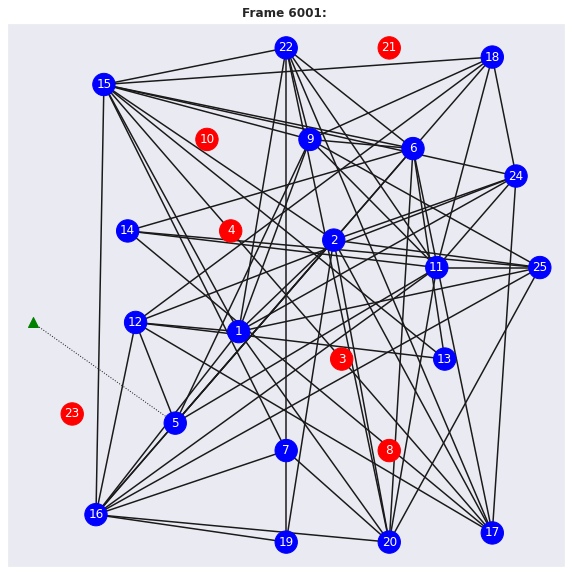

In [10]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation
from networkx.drawing.nx_pydot import graphviz_layout
import seaborn as sns
from IPython.display import HTML

sns.set()

def visalize_graph(G, ax=None):
    master_nodes = [n for (n,ty) in \
    nx.get_node_attributes(G,'type').items() if ty == 'peer']
    client_nodes = [n for (n,ty) in \
        nx.get_node_attributes(G,'type').items() if ty == 'client']
    online_map = {n:ty for (n,ty) in nx.get_node_attributes(G,'is_online').items()}
    
    colors = ['blue' if online_map[k] else 'red' for k in master_nodes]
    
    nx.draw_networkx_nodes(G, pos, nodelist=master_nodes, \
        node_color=colors, node_shape='o', node_size=500, ax=ax)
    nx.draw_networkx_nodes(G, pos, nodelist=client_nodes,  \
        node_color='green', node_shape='^', node_size=100, label=1, ax=ax)
    nx.draw_networkx_labels(G, pos, labels={k:k for k in master_nodes}, font_color='w', ax=ax)
    
    nx.draw_networkx_edges(G, pos, edgelist=G.subgraph(master_nodes).edges(), width=1.5, ax=ax)
    nx.draw_networkx_edges(G, pos, edgelist=G.edges(nbunch=client_nodes),  style='dotted', ax=ax)

    

# Init Graph
sim = BaseSimulation(Locations, topology, peer_services, service_impl, seed=42)
G = sim.get_graph()
pos = graphviz_layout(G)

# Build plot
fig, ax = plt.subplots(figsize=(10,10))

def update(num):
    if num !=0:
        sim.run(num)
    G = sim.get_graph()

    ax.clear()
    visalize_graph(G, ax)
    # Scale plot ax
    ax.set_title("Frame %d: "%(num+1), fontweight="bold")
    ax.set_xticks([])
    ax.set_yticks([])


ani = matplotlib.animation.FuncAnimation(fig, update, frames=range(0, 6100, 100))
HTML(ani.to_jshtml())

In [11]:
import pandas as pd

def total_delay(sim, peer_id, storage_name):
    store = sim.peers[peer_id].get_storage(storage_name).txs
    for k, peer_time in store.items():
        client_id, msg_num = k.split('_')
        client_id = int(client_id)
        msg_num = int(msg_num)
        client_time = sim.peers[client_id].storage[storage_name].txs[k]
        yield (int(msg_num), peer_time - client_time)
        
def get_gossip_table(sim, storage_name):
    return pd.DataFrame({k: dict(total_delay(sim, k, storage_name)) 
                         for k in sim.types_peers['peer']}).sort_index()

df = get_gossip_table(sim, 'msg_time')
df

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,78.785608,78.545058,78.557464,37.909658,0.294504,78.286748,1.020900,78.710294,0.587473,144.291834,...,0.574327,75.292984,78.549177,78.622787,0.807036,78.765509,75.014271,37.637888,156.822192,78.508385
2,102.730934,78.331382,103.029800,38.576292,0.305422,78.592111,148.160112,154.480520,76.254336,144.620517,...,75.572397,74.653378,102.765826,NaN,76.829557,152.931921,74.943401,112.289352,75.373212,104.933803
3,103.014121,78.173825,103.475177,144.425010,0.230819,78.451052,0.793939,79.009425,0.492274,38.868225,...,0.517918,74.961310,78.689039,79.060650,1.093682,78.470255,1.333901,36.836228,75.381264,78.541386
4,78.570485,78.579797,78.942551,37.293546,0.271818,78.326742,0.831384,NaN,0.577390,144.427953,...,0.551114,1.141761,78.850887,78.847173,0.770985,78.907480,0.902796,38.621195,1.376475,78.809660
5,78.616774,78.358271,78.638971,37.291769,0.296023,78.904077,NaN,234.620147,156.551287,110.459012,...,74.766570,74.306840,79.140363,78.610704,0.887555,78.871051,0.999005,111.040560,73.077646,79.116673
6,78.823066,78.765293,103.209302,35.827908,0.261437,78.751975,204.024236,103.011713,0.777938,39.297760,...,0.502296,181.078650,101.843522,78.502924,156.714177,79.103296,1.018984,37.549478,NaN,78.852978
7,NaN,NaN,NaN,36.896762,0.299519,78.284376,NaN,NaN,73.650547,36.290226,...,NaN,NaN,152.250662,151.446952,NaN,101.586149,73.340011,167.167247,74.158170,78.852907
8,152.046744,NaN,78.781903,36.975534,0.281836,NaN,NaN,NaN,0.537447,NaN,...,NaN,74.471512,NaN,NaN,NaN,NaN,1.015119,217.698657,74.074028,NaN
9,151.707326,102.768214,151.426721,300.053370,0.317030,78.352518,74.045848,152.266928,NaN,36.928909,...,73.816726,73.401223,151.612889,NaN,74.240092,102.512347,181.242557,111.835876,73.639600,152.044312
11,78.680970,79.207363,78.709544,193.482567,0.339323,78.865865,NaN,NaN,156.629999,37.558875,...,0.653707,NaN,234.565757,78.704437,156.672530,78.936604,0.925650,144.123483,73.263509,78.628030


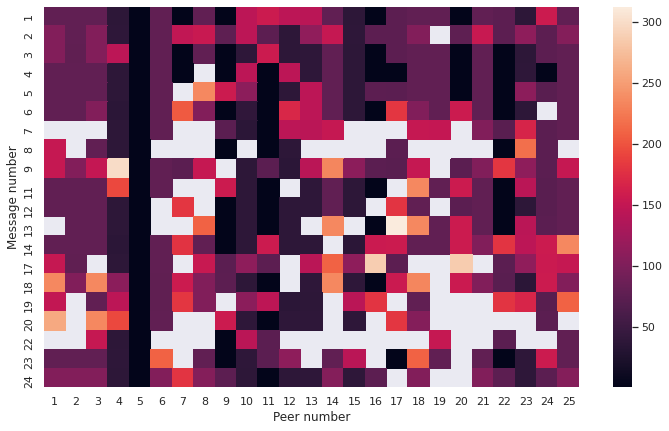

In [12]:
import seaborn as sns
sns.set()

def show_heat_map(df):
    plt.figure(figsize=(12, 7))
    ax = plt.axes()

    sns.heatmap(df, ax=ax)

    plt.xlabel('Peer number', fontsize = 12) # x-axis label with fontsize 15
    plt.ylabel('Message number', fontsize = 12) # y-axis label with fontsize 15

    plt.show()

show_heat_map(df)

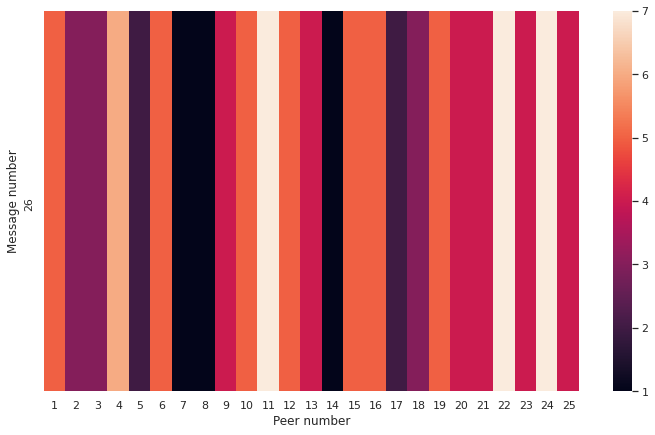

In [13]:
# Show average overhead on message

def calc_overhead(sim, peer_id, storage_name):
    store = sim.peers[peer_id].storage[storage_name].times_seen
    for k, times in store.items():
        msg_num, client_id = k.split('_')
        yield (int(msg_num), int(times))
    
def get_overhead_table(sim, storage_name):
    return pd.DataFrame({k: dict(calc_overhead(sim, k, storage_name)) 
                         for k in sim.types_peers['peer']}).sort_index()

def show_overhead_hist(overhead_table):
    plt.figure(figsize=(10, 6))
    sns.distplot(overhead_table, norm_hist=True)
    plt.xlabel('Overhead (message seen by same peer)', fontsize=15)

def get_monitor_time_table(sim, data='bytes'):
    if data == 'bytes':
        data_func = lambda x: x.bytes_load  
    elif data == 'msg_count':
        data_func = lambda x: x.msg_count_load  

    return pd.DataFrame({k: data_func(sim.peers[k])
                         for k in sim.types_peers['peer']}).sort_index()

def show_bandwidth_time(tt_df):
    tt_df2 = tt_df\
        .stack()\
        .reset_index()\
        .rename(columns={'level_0':'time', 'level_1':'peer_id', 0: 'data'})

    plt.figure(figsize=(10,6))
    ax = sns.lineplot(x='time', y='data', data=tt_df2, 
                 ci='sd', estimator="median",)

    ax.set_title('Bandwidth overhead', fontsize= 20 )
    ax.set_xlabel('Time (s)', fontsize=12)
    tl = ax.set_ylabel('Overhead per second (bytes/sec)', fontsize=12)
    
def show_msg_count_time(tt_df):
    tt_df2 = tt_df\
        .stack()\
        .reset_index()\
        .rename(columns={'level_0':'time', 'level_1':'peer_id', 0: 'data'})

    plt.figure(figsize=(10,6))
    ax = sns.lineplot(x='time', y='data', data=tt_df2, 
                 ci='sd', estimator="median",)

    ax.set_title('Msg count overhead', fontsize= 20 )
    ax.set_xlabel('Time (s)', fontsize=12)
    tl = ax.set_ylabel('Overhead per second (count/sec)', fontsize=12)


oh = get_overhead_table(sim, 'msg_time')
show_heat_map(oh)            

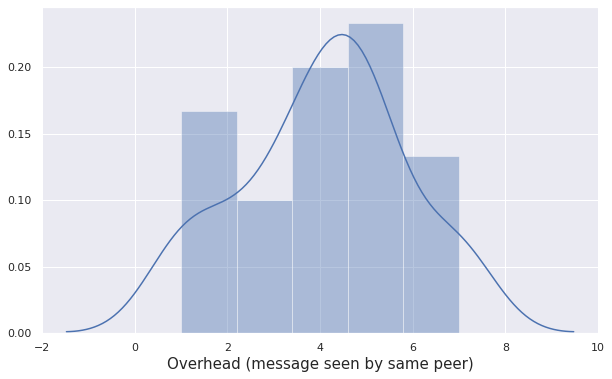

In [14]:
show_overhead_hist(oh)

## Workload overhead per second

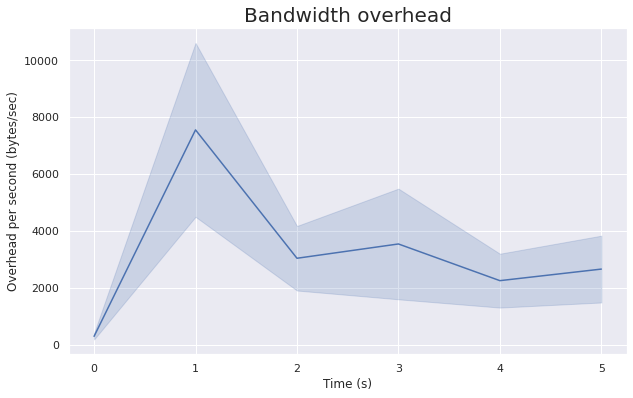

In [15]:
bw_oh_tt = get_monitor_time_table(sim)
show_bandwidth_time(bw_oh_tt)

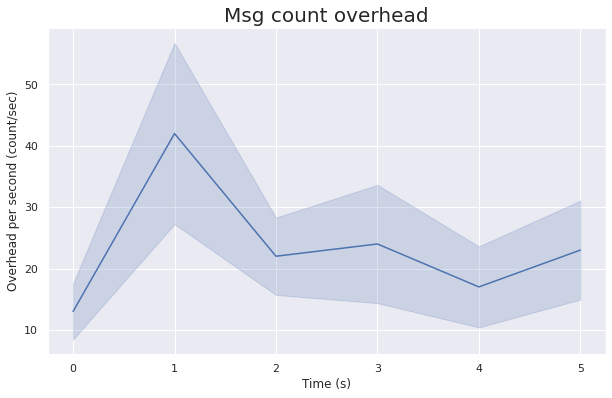

In [16]:
mc_oh_tt = get_monitor_time_table(sim, data='msg_count')
show_msg_count_time(mc_oh_tt)

As you can see not all peers now get the message. This is because some peers might be offline at the moment of disseminating the message. This can lead to the message loss.

One of the most critical failures is the failure of a peer directly connected to the client.  

Here are some common ways to ensure that client will be connected and message won't be lost:
- Client must be connected to multiple peers chosen from a diverse group of peers. This minimize the probability that client is connected to a faulty or malicious peer.
- Message should have some meta-data indicators to quickly make sense what is missing. Additionally, if message is depended upon previous messages it includes reference pointers. The simplest index is a *client message counter*. Peer can easily identify if they are missing some messages by going through the range. 
- To ensure *"eventual consistency"* [TODO add link] peer needs to periodically synchronize the data with each other. Example of such a process is sometimes called *set reconciliation*, *anti-entropy*. This commonly used in *AP* databases [TODO add link]. 



# More client connections!


In [17]:
from random import sample

num_cons = 5 # connect to 5 peers 

for c in sim.types_peers['client']:
    for p in sample(list(sim.types_peers['peer']), num_cons):
        topology.add_edge(c, p)

# Gossip with periodical synchronization 


Let's ensure that all the peers will eventually receive all data from a client. First, we will connect `client` to multiple peers. Second, we will replace simple gossip with a pull based gossip. Pull-based gossip is based on periodical synchronization by exchanging views with their direct neighbors. 



In [18]:
from p2psimpy.services.gossip import PullGossipService, RangedPullGossipService

service_impl['GossipService'] = RangedPullGossipService

sim_pull = BaseSimulation(Locations, topology, peer_services, service_impl)
sim_pull.run(5_000)

!


## Average receive time

In [19]:
df_pl = get_gossip_table(sim_pull, 'msg_time')
df_pl

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,498.806563,629.876320,305.474562,65.639686,0.478980,268.425089,424.376536,263.246064,268.247896,65.340092,...,113.815162,343.820513,311.658697,466.708325,347.146338,469.113634,227.145026,261.384887,266.464697,65.573171
2,538.642193,567.699797,498.504065,288.339297,0.482714,536.552627,730.478307,324.397646,183.480830,65.406279,...,252.104899,37.201224,111.658697,615.468761,647.102115,269.113634,410.679763,322.416251,66.464697,65.183480
3,598.777576,367.699797,298.504065,454.990568,0.506678,730.088025,532.335694,363.148225,647.523956,65.550355,...,454.958510,36.722129,411.718853,755.813946,447.102115,1311.402787,297.200120,361.416639,510.607032,65.720177
4,629.076982,167.699797,98.504065,65.391896,0.490859,530.088025,332.335694,163.148225,447.523956,65.562904,...,254.958510,35.711377,211.718853,555.813946,416.302721,1111.402787,97.200120,161.416639,310.607032,414.159804
5,509.229738,1240.750154,629.792006,65.316475,0.506240,830.240416,1124.284369,963.087752,628.771620,65.339255,...,214.479931,858.650196,1011.683106,1043.759761,1216.242565,1168.812579,310.788702,214.292678,1114.404032,214.159804
6,309.229738,1040.750154,429.792006,65.667974,819.387987,630.240416,924.284369,763.087752,428.771620,65.427523,...,191.439383,658.650196,811.683106,843.759761,1016.242565,968.812579,110.788702,197.268714,914.404032,65.541829
7,1185.280456,840.750154,1220.549958,65.353488,0.469329,567.814032,1724.345950,1731.656556,682.436303,65.669588,...,491.344643,1029.628875,758.033574,955.812044,1005.394959,768.812579,672.060320,1061.324765,1192.929321,65.427561
8,985.280456,798.594649,258.814144,65.456702,0.679132,298.632372,1524.345950,1531.656556,336.705114,614.193406,...,454.899286,37.629289,558.033574,829.642228,805.394959,865.895049,472.060320,988.940295,515.185354,1006.540160
9,785.280456,440.750154,58.814144,755.405795,0.510361,98.632372,1324.345950,1331.656556,136.705114,414.193406,...,91.344643,36.642539,358.033574,555.812044,605.394959,369.263241,272.060320,661.324765,315.185354,65.514362
10,585.280456,398.594649,398.564958,555.405795,0.498041,474.545960,1129.370424,1131.656556,968.560974,65.416743,...,1152.329055,36.852946,655.801262,429.642228,405.394959,554.460017,310.814926,588.940295,592.929321,1397.143988


As you can see it takes more time on average to reach a peer, namely: 

In [20]:
change = df_pl.mean().mean()/ df.mean().mean()
change 

5.499708919969447

## Overhead

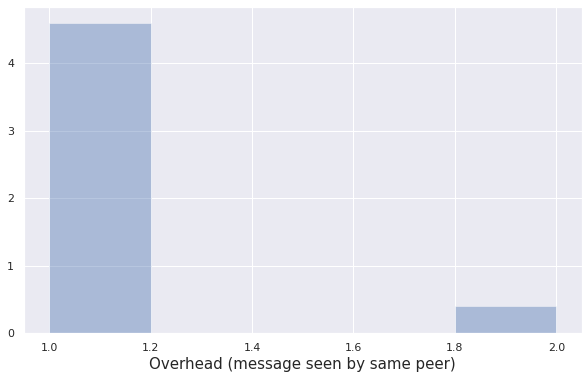

In [21]:
oh_pl = get_overhead_table(sim_pull, 'msg_time')
show_overhead_hist(oh_pl)

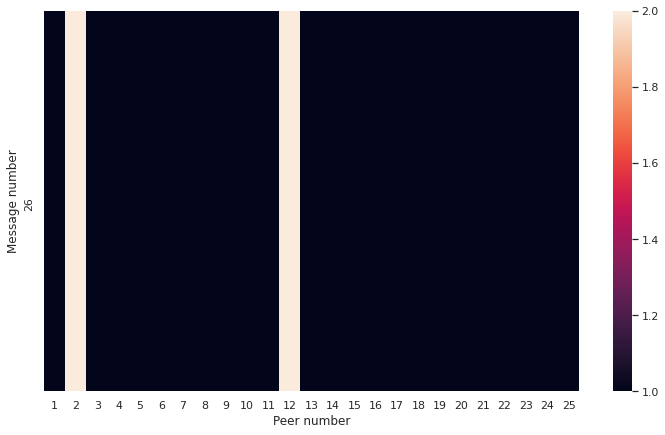

In [22]:
show_heat_map(oh_pl)

### Overhead over time

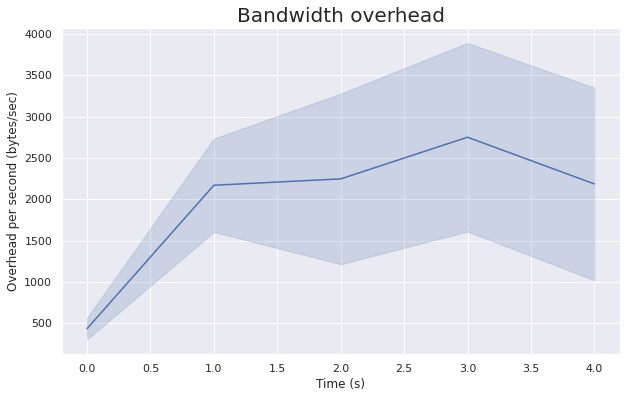

In [23]:
bw_oh_tt_pull = get_monitor_time_table(sim_pull)
show_bandwidth_time(bw_oh_tt_pull)

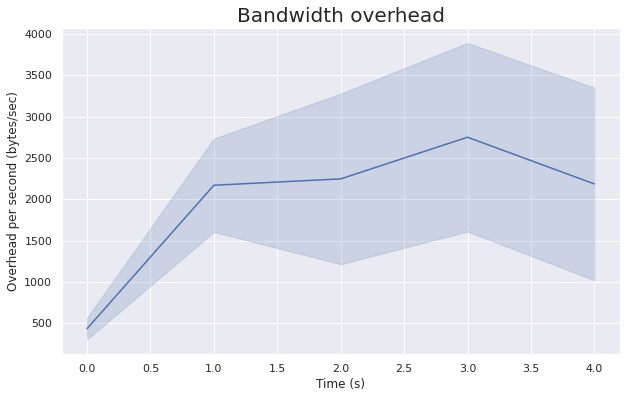

In [24]:
bw_oh_tt_pull = get_monitor_time_table(sim_pull)
show_bandwidth_time(bw_oh_tt_pull)

In [25]:
bw_oh_tt_pull.mean(axis=1).mean() / bw_oh_tt.mean(axis=1).mean() 

0.6264358278215054

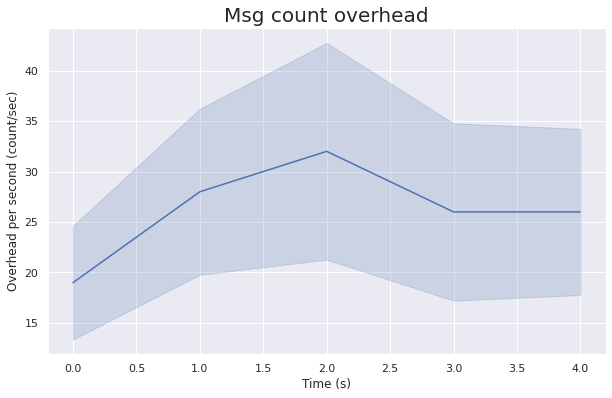

In [26]:
mc_oh_tt_pull = get_monitor_time_table(sim_pull, data='msg_count')
show_msg_count_time(mc_oh_tt_pull)

In [27]:
mc_oh_tt_pull.mean(axis=1).mean() / mc_oh_tt.mean(axis=1).mean() 

1.1068493150684933

Pull based gossip takes more time to converge on average, but enjoys a lesser overhead. 

The main ideas of such gossip is to periodically exchange indices of messages instead of messages itself. When peers discover that some messages are missing (by inspecting received indexes) they request missing messages by their indices. This approach saves bandwidth and generally achieves higher throughput (msg per second) with a trade-off of latency.   


In [28]:
sim_pull.save_experiment(expr_dir='crash_gossip', include_module_classes=True)

# More experiments 

Test your gossip from the previous notebook. How good it can handle periodical outages? 

Try different topologies? Will the gossip work for all the topologies? 

Report your findings here:


In [47]:
# We load our previous experiments respectively.
# Emergent topology take less time than default settings to reach, but it has
# much larger overhead.
# As for our final protocol, the time is realtively larger. However, the overhead is
# the smallest. I think the gossip protocol won't work for all the topologies.
# If the connection between nodes is relatively sparse, the performance might be bad and unstable.

!


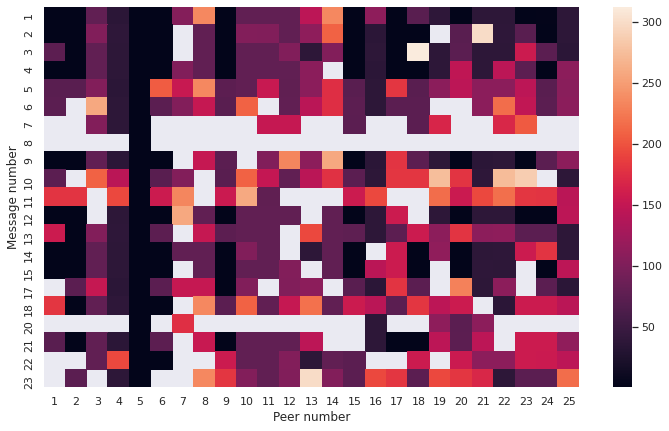

average tim: 89.973257
overhead: 3189.306667


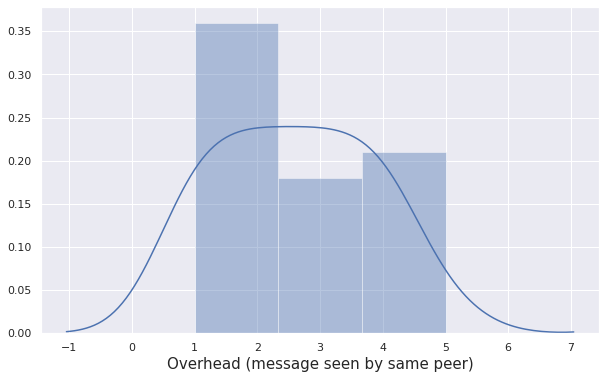

In [40]:
# test on default settings
exp0 = BaseSimulation.load_experiment(expr_dir='gossip_expr/0')
Locations, topology, peer_services, service_impl = exp0
peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig
service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = MessageProducer
service_impl['GossipService'] = GossipService
sim0 = BaseSimulation(Locations, topology, peer_services, service_impl)
sim0.run(6_000)
df0 = get_gossip_table(sim0, 'msg_time')
show_heat_map(df0)
oh0 = get_overhead_table(sim0, 'msg_time')
show_overhead_hist(oh0)
bw0 = get_monitor_time_table(sim0)

print("average tim: %f" % df0.mean().mean())
print("overhead: %f" % bw0.mean(axis=1).mean())

!


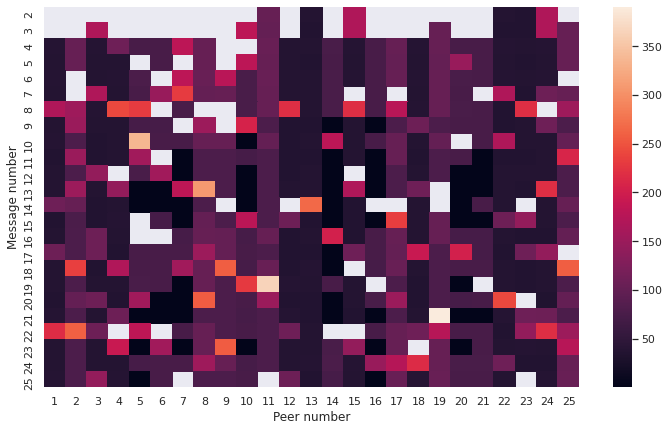

average tim: 79.116640
overhead: 9872.260000


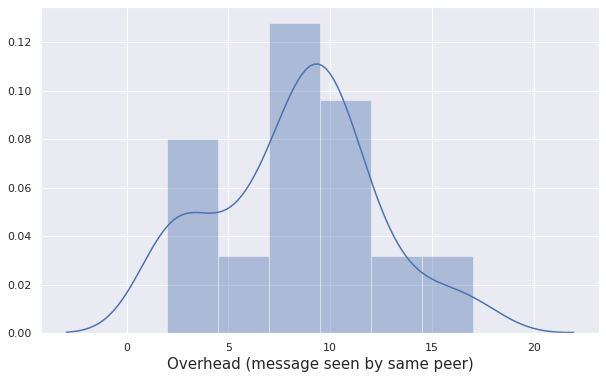

In [44]:
# test on emergent topology
from p2psimpy.services.connection_manager import P2PConnectionManager

exp1 = BaseSimulation.load_experiment(expr_dir='gossip_expr/1')
Locations, topology, peer_services, service_impl = exp1
peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig
service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = MessageProducer
service_impl['GossipService'] = GossipService
service_impl['P2PConnectionManager'] = P2PConnectionManager

sim1 = BaseSimulation(Locations, topology, peer_services, service_impl)
sim1.run(6_000)
df1 = get_gossip_table(sim1, 'msg_time')
show_heat_map(df1)
oh1 = get_overhead_table(sim1, 'msg_time')
show_overhead_hist(oh1)
bw1 = get_monitor_time_table(sim1)

print("average tim: %f" % df1.mean().mean())
print("overhead: %f" % bw1.mean(axis=1).mean())

!


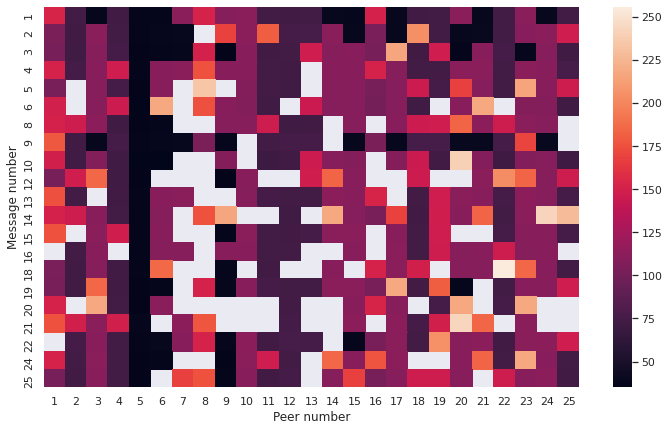

average tim: 105.839940
overhead: 3469.653333


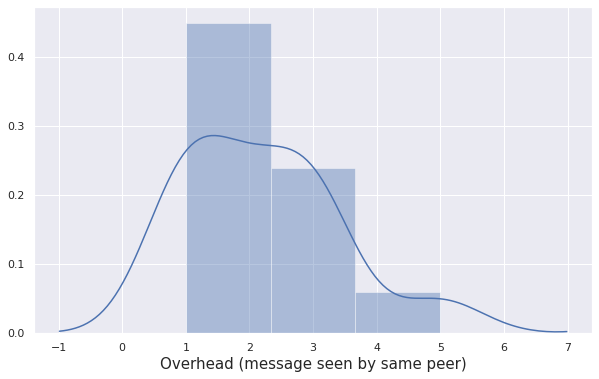

In [45]:
# test on better protocol
exp2 = BaseSimulation.load_experiment(expr_dir='gossip_expr/final')
Locations, topology, peer_services, service_impl = exp2
peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig
service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = MessageProducer
service_impl['GossipService'] = GossipService
# service_impl['P2PConnectionManager'] = P2PConnectionManager

sim2 = BaseSimulation(Locations, topology, peer_services, service_impl)
sim2.run(6_000)
df2 = get_gossip_table(sim2, 'msg_time')
show_heat_map(df2)
oh2 = get_overhead_table(sim2, 'msg_time')
show_overhead_hist(oh2)
bw2 = get_monitor_time_table(sim2)

print("average tim: %f" % df2.mean().mean())
print("overhead: %f" % bw2.mean(axis=1).mean())